In [1]:
!gdown 1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=bbf8abf0-1f8f-4e23-958e-090ae154eed1
To: /content/ninjacart_data.zip
100% 275M/275M [00:05<00:00, 48.5MB/s]


In [2]:
!unzip /content/ninjacart_data.zip

Archive:  /content/ninjacart_data.zip
replace ninjacart_data/test/indian market/bhl.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [28]:
train_folder='/content/ninjacart_data/train'

In [29]:
import os

In [30]:
images=[]

for folder in os.listdir(train_folder):
  # print(folder)
  for image in os.listdir(train_folder+'/'+folder):
    # print(image)
    images.append(os.path.join(train_folder,folder,image))

print(images[:10])


['/content/ninjacart_data/train/onion/onion11097.jpeg', '/content/ninjacart_data/train/onion/onion11104.jpeg', '/content/ninjacart_data/train/onion/T4VQK5FDJIPQ.jpg', '/content/ninjacart_data/train/onion/onion11027.jpeg', '/content/ninjacart_data/train/onion/FJQL1BASFF4L.jpg', '/content/ninjacart_data/train/onion/JM4FSLO4O197.jpg', '/content/ninjacart_data/train/onion/onion11176.jpeg', '/content/ninjacart_data/train/onion/P9AT7MJP8MD9.jpg', '/content/ninjacart_data/train/onion/onion1143.jpeg', '/content/ninjacart_data/train/onion/onion1186.jpeg']


In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import random
import glob
import tensorflow as tf

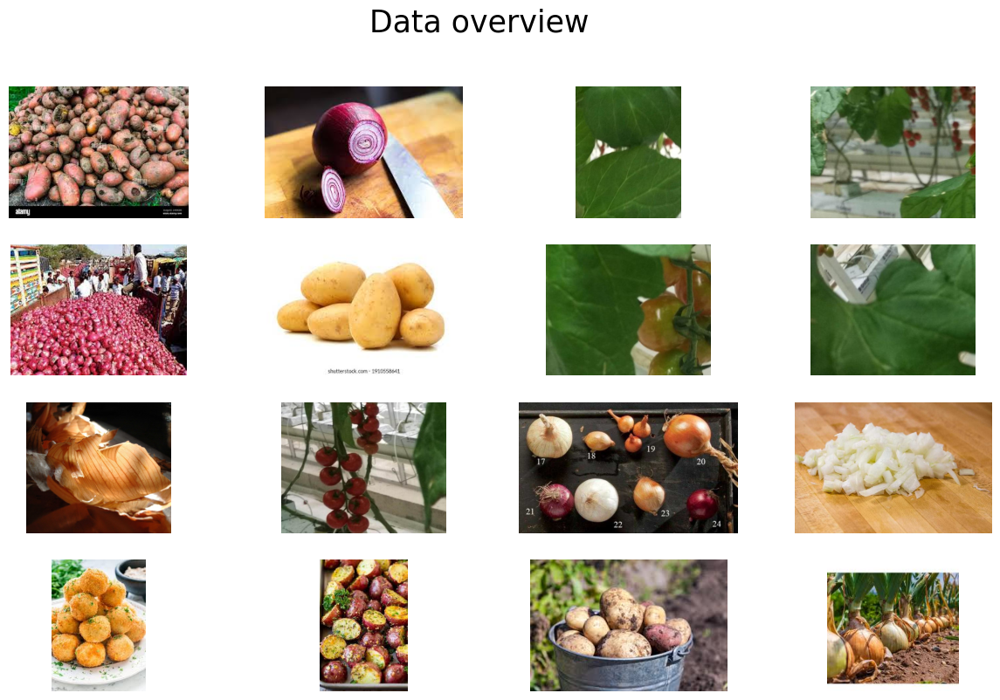

In [32]:
fig=plt.figure(figsize=(15,9))
fig.suptitle('Data overview',fontsize=25)

for i in range(16):
  random_image=random.choice(images)
  img=tf.keras.utils.load_img(random_image)
  plt.subplot(4,4,i+1)
  plt.axis('off')
  plt.imshow(img)

plt.show()


In [33]:
test_folder='/content/ninjacart_data/test'

In [34]:
img_paths=[(train_folder,'train'),(test_folder,'test')]
img_paths

[('/content/ninjacart_data/train', 'train'),
 ('/content/ninjacart_data/test', 'test')]

In [35]:
image_dict={}
count_dict={}
for path in img_paths:
  dir_path,label=path[0],path[1]
  # print(dir_path)
  # print(label)

  class_dirs=os.listdir(dir_path)

  image_dict[label]={}
  count_dict[label]={}

  for cls in class_dirs:
    file_paths=glob.glob(f"{dir_path}/{cls}/*")
    # print(file_paths)
    count_dict[label][cls]=len(file_paths)
    # print(count_dict[label][cls])
    image_paths=random.choice(file_paths)
    image_dict[label][cls]=tf.keras.utils.load_img(image_paths)
    # print(image_dict[label][cls])

In [36]:
image_dict

{'train': {'onion': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x360>,
  'indian market': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2070x1380>,
  'potato': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=285x177>,
  'tomato': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=400x500>},
 'test': {'onion': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=635x423>,
  'indian market': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=259x195>,
  'potato': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=300x168>,
  'tomato': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=400x500>}}

In [37]:
count_dict

{'train': {'onion': 849, 'indian market': 599, 'potato': 898, 'tomato': 789},
 'test': {'onion': 83, 'indian market': 81, 'potato': 81, 'tomato': 106}}

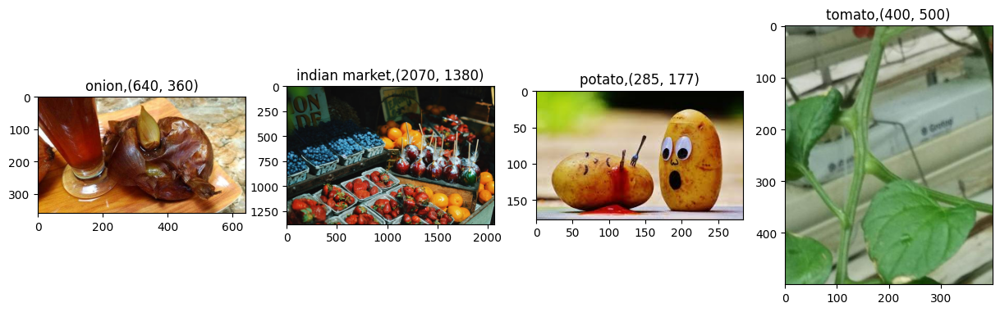

In [38]:
plt.figure(figsize=(15,7))

for i,(cls,img) in enumerate(image_dict['train'].items()):
  ax=plt.subplot(1,4,i+1)
  plt.imshow(img)
  plt.title(f'{cls},{img.size}')

In [39]:
import pandas as pd
import numpy as np


count of training samples per class:
            class  count
0          onion    849
1  indian market    599
2         potato    898
3         tomato    789 



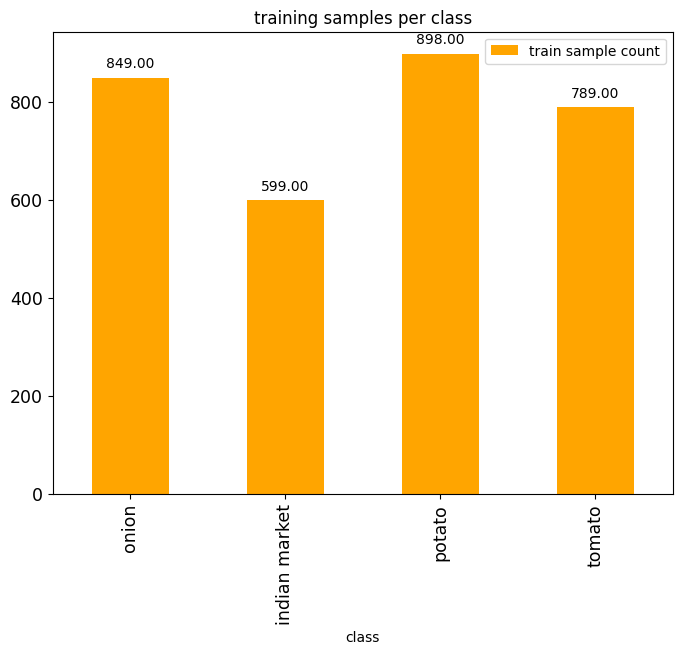


count of testing samples per class:
            class  count
0          onion     83
1  indian market     81
2         potato     81
3         tomato    106 



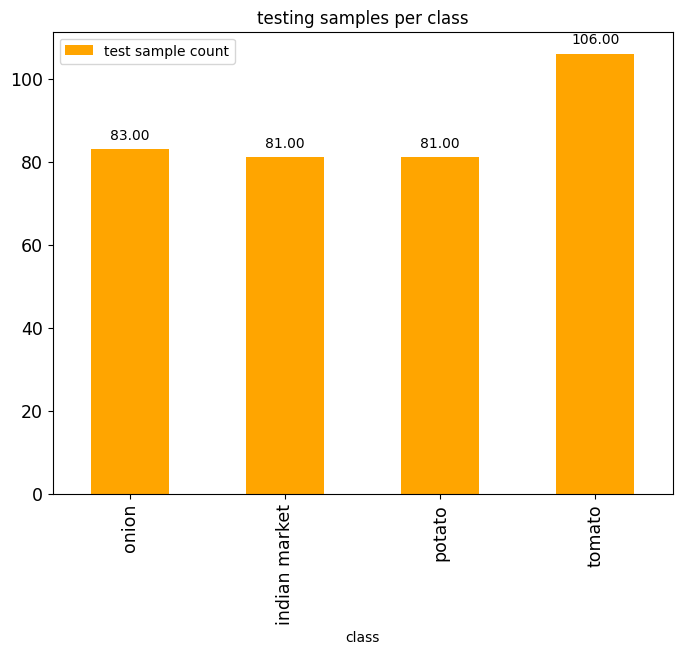

In [40]:
for data in count_dict:
  # print(count_dict[data])
  df_count=pd.DataFrame({
      'class':count_dict[data].keys(),
      'count':count_dict[data].values()
  })
  print(f'\ncount of {data}ing samples per class:\n',df_count,'\n')

  a=df_count.plot.bar(x='class',
                      y='count',
                      title=f'{data}ing samples per class',
                      label=f'{data} sample count',
                      color='orange',
                      figsize=(8,6),
                      fontsize=12.5)
  for p in a.patches:
    a.annotate(f'{p.get_height():0.2f}',(p.get_x()+p.get_width()/2.,p.get_height()),
               ha='center',va='center',xytext=(0,10),textcoords='offset points')

  plt.show()

In [41]:
image_size=(256,256)
batch_size=32
seed=2022

In [42]:
train_ds=tf.keras.utils.image_dataset_from_directory(directory=train_folder,
                                                     label_mode='categorical',
                                                     batch_size=batch_size,
                                                     image_size=image_size,
                                                     seed=seed,
                                                     validation_split=0.2,
                                                     subset='training',
                                                     shuffle=True)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.


In [43]:
test_ds=tf.keras.utils.image_dataset_from_directory(directory=test_folder,
                                                    label_mode='categorical',
                                                    image_size=image_size,
                                                    batch_size=batch_size,
                                                    seed=seed)

Found 351 files belonging to 4 classes.


In [44]:
valid_ds=tf.keras.utils.image_dataset_from_directory(directory=train_folder,
                                                     label_mode='categorical',
                                                     batch_size=batch_size,
                                                     image_size=image_size,
                                                     seed=seed,
                                                     validation_split=0.2,
                                                     subset='validation')

Found 3135 files belonging to 4 classes.
Using 627 files for validation.


In [45]:
model=tf.keras.Sequential([

    tf.keras.layers.Rescaling(1./255,input_shape=(image_size[0],image_size[1],3)),

    tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu'),
    tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),

    tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu'),
    tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),

    tf.keras.layers.Conv2D(filters=128,kernel_size=(3,3),padding='same',activation='relu'),

    tf.keras.layers.GlobalAveragePooling2D(),

    tf.keras.layers.Dense(4,activation='softmax')

])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [46]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=['accuracy','Precision','Recall']
)

In [47]:
log_dir_1='logs/Custom_CNN_model'
tensorboard_cb=tf.keras.callbacks.TensorBoard(log_dir=log_dir_1,histogram_freq=1)

In [48]:
history=model.fit(train_ds,epochs=20,validation_data=valid_ds,callbacks=[tensorboard_cb])

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - Precision: 0.0500 - Recall: 5.9969e-05 - accuracy: 0.3085 - loss: 1.3526 - val_Precision: 0.9661 - val_Recall: 0.0909 - val_accuracy: 0.5997 - val_loss: 1.0981
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - Precision: 0.8832 - Recall: 0.2470 - accuracy: 0.5906 - loss: 0.9842 - val_Precision: 0.8319 - val_Recall: 0.4498 - val_accuracy: 0.6778 - val_loss: 0.8036
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 167ms/step - Precision: 0.8463 - Recall: 0.4808 - accuracy: 0.7091 - loss: 0.7785 - val_Precision: 0.7991 - val_Recall: 0.5901 - val_accuracy: 0.7257 - val_loss: 0.7137
Epoch 4/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - Precision: 0.8293 - Recall: 0.6282 - accuracy: 0.7445 - loss: 0.6769 - val_Precision: 0.8040 - val_Recall: 0.6475 - val_accuracy: 0.7257 - val_loss: 0.6767
Epoch 5/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - Precision: 0.8193 - Recall: 0.6593 - accuracy: 0.7531 - loss: 0.6413 - val_Precision: 0.8373 - va

In [49]:
def plot_acc_loss(model_history, n_epochs):

  fig, axes = plt.subplots(1, 2,figsize=(15,5))
  ax = axes.ravel()

  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['accuracy']], label='Train', color='b')
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['val_accuracy']], label='Val', color='r')
  ax[0].set_title('Accuracy vs epoch', fontsize=15)
  ax[0].set_ylabel('Accuracy', fontsize=15)
  ax[0].set_xlabel('epoch', fontsize=15)
  ax[0].legend()

  ax[1].plot(range(0, n_epochs), model_history.history['loss'], label='Train', color='b')
  ax[1].plot(range(0, n_epochs), model_history.history['val_loss'], label='Val', color='r')
  ax[1].set_title('Loss vs epoch', fontsize=15)
  ax[1].set_ylabel('Loss', fontsize=15)
  ax[1].set_xlabel('epoch', fontsize=15)
  ax[1].legend()

  plt.show()

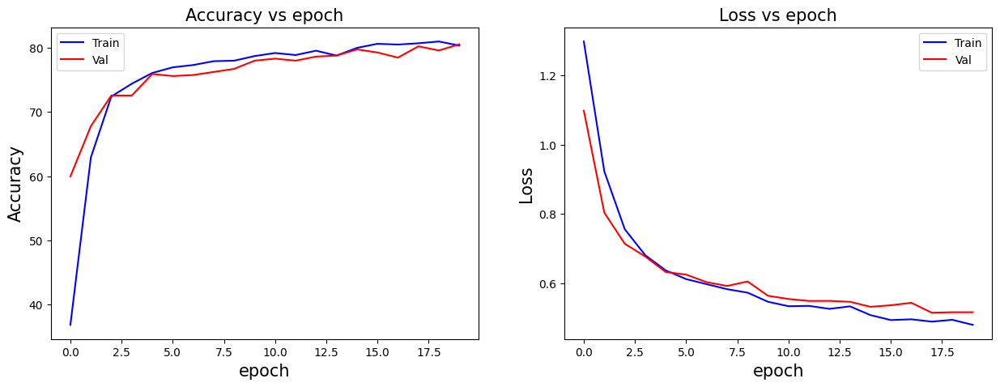

In [50]:
plot_acc_loss(history,n_epochs=20)

In [51]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 419,822 (1.60 MB)

 Trainable params: 139,940 (546.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 279,882 (1.07 MB)

In [52]:
test_images=[]

for folder in os.listdir(test_folder):
  for image in os.listdir(test_folder+'/'+folder):
    test_images.append(os.path.join(test_folder,folder,image))

test_images[:10]

['/content/ninjacart_data/test/onion/6Y1QYL44X8F1.jpg',
 '/content/ninjacart_data/test/onion/25PZO5RHZYMU.jpg',
 '/content/ninjacart_data/test/onion/8TZL7DPFBOOG.jpg',
 '/content/ninjacart_data/test/onion/128HMGKA3VT7.jpg',
 '/content/ninjacart_data/test/onion/6486L1RXU3QT.jpg',
 '/content/ninjacart_data/test/onion/7Q9RLVPLQ4CA.jpg',
 '/content/ninjacart_data/test/onion/80OPBDG1F7A8.jpg',
 '/content/ninjacart_data/test/onion/9D3QTE0S52O4.jpg',
 '/content/ninjacart_data/test/onion/14T8M955CTOF.jpg',
 '/content/ninjacart_data/test/onion/9OLE83G2SR94.jpg']

In [53]:
classes=['noise','onion','potato','tomato']

In [54]:
def test_model(model_name):
  fig=plt.figure(1,figsize=(17,11))

  for i in range(8):
    im=tf.keras.utils.load_img(random.choice(test_images))
    im=tf.keras.utils.img_to_array(im)
    im=tf.image.resize(im,(256,256))
    im_1=tf.expand_dims(im,axis=0)

    pred=model_name.predict(im_1, verbose=0)
    predicted_label=tf.argmax(pred,1).numpy().item()

    for item in pred:
      item=tf.round((item*100))

    plt.subplot(2,4,i+1)
    plt.axis('off')

    plt.title(f'prediction : {classes[predicted_label]}\n\n'
    f'{item[0]} % {classes[0]}\n'
    f'{item[1]} % {classes[1]}\n'
    f'{item[2]} % {classes[2]}\n'
    f'{item[3]} % {classes[3]}\n')

    plt.imshow(im.numpy()/255)
  plt.show()

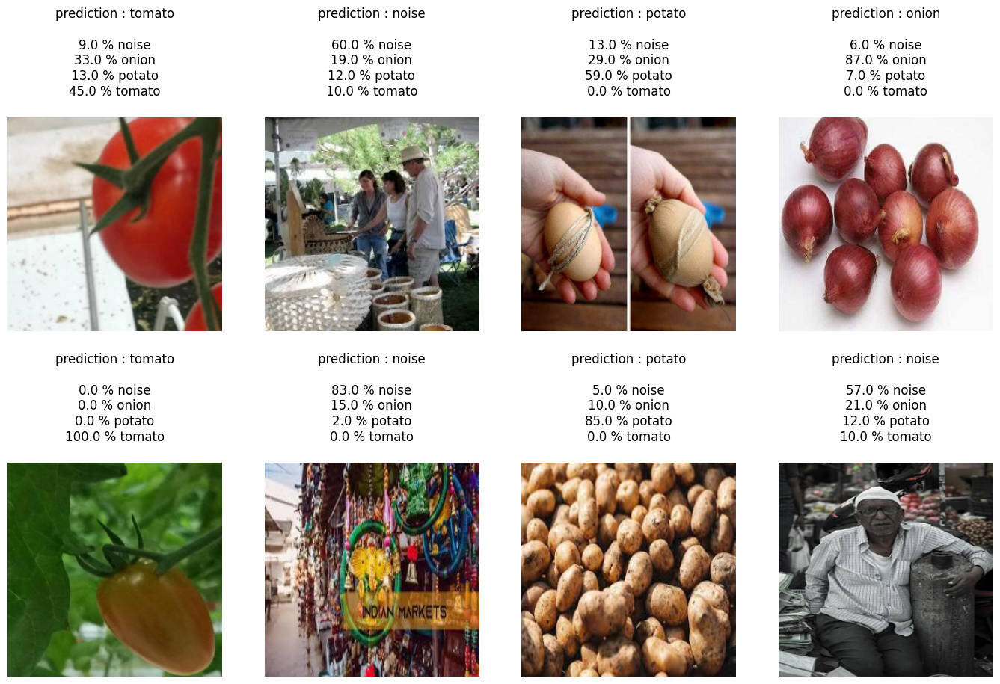

In [55]:
test_model(model)

In [56]:
noise_path = '/content/ninjacart_data/test/indian market'
onion_path = '/content/ninjacart_data/test/onion'
potato_path = '/content/ninjacart_data/test/potato'
tomato_path = '/content/ninjacart_data/test/tomato'

In [57]:
def classwise_accuracy(class_path,class_name,model_name):
  paths=[]

  for path in os.listdir(class_path):
    paths.append(class_path+'/'+path)

  correct=0
  total=0

  for i in range(len(paths)):
    total+=1

    img=tf.keras.utils.load_img(paths[i])
    img=tf.keras.utils.img_to_array(img)
    img=tf.image.resize(img,(256,256))
    img=tf.expand_dims(img,axis=0)

    pred=model_name.predict(img,verbose=0)

    if tf.argmax(pred[0])==classes.index(f'{class_name}'):
      correct+=1

  print(f"Accuracy of class {class_name} is {round((correct/total)*100,2)}% consisting of {len(paths)} images")


In [58]:
classwise_accuracy(noise_path, 'noise', model)
classwise_accuracy(onion_path, 'onion', model)
classwise_accuracy(potato_path, 'potato', model)
classwise_accuracy(tomato_path, 'tomato', model)

Accuracy of class noise is 74.07% consisting of 81 images
Accuracy of class onion is 48.19% consisting of 83 images
Accuracy of class potato is 77.78% consisting of 81 images
Accuracy of class tomato is 100.0% consisting of 106 images


In [59]:
noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

In [60]:
def conf_mat(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

In [61]:
conf_mat(noise_path, l1, model)
conf_mat(onion_path, l2, model)
conf_mat(potato_path, l3, model)
conf_mat(tomato_path, l4, model)

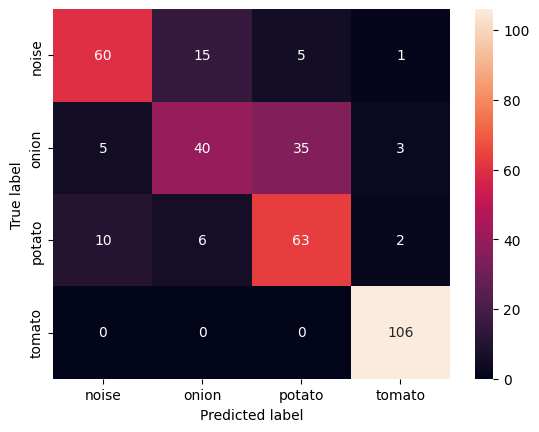

In [62]:
ax = sns.heatmap(np.array([l1, l2, l3, l4]), xticklabels=classes, yticklabels=classes, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [63]:
result=model.evaluate(test_ds)
dict(zip(model.metrics_names,result))

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 428ms/step - Precision: 0.7872 - Recall: 0.7226 - accuracy: 0.7497 - loss: 0.5537


{'loss': 0.5070860385894775, 'compile_metrics': 0.7777777910232544}

In [74]:
augmentation=tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_veritcal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor=0.2,width_factor=0.2)
])

aug_ds=train_ds

for image,label in aug_ds:
  image=augmentation(image)

In [75]:
model_revamp=tf.keras.Sequential([

    tf.keras.layers.Rescaling(1./255,input_shape =(image_size[0], image_size[1], 3)),

    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),

    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPool2D(pool_size = (2,2)),

    tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.2),

    tf.keras.layers.Dense(4, activation='softmax')
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [76]:
model_revamp.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                     loss=tf.keras.losses.CategoricalCrossentropy(),
                     metrics=['accuracy','Precision','Recall'])

In [77]:
log_dir_2='logs/Custom_CNN_revamp'
tensorboard_cb=tf.keras.callbacks.TensorBoard(log_dir=log_dir_2,histogram_freq=1)
checkpoint_cb=tf.keras.callbacks.ModelCheckpoint("CNN_revamp.keras",save_best_only=True)
early_stopping_cb=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

In [78]:
history_1=model_revamp.fit(train_ds,
                           epochs=20,
                           validation_data=valid_ds,
                           callbacks=[tensorboard_cb,checkpoint_cb,early_stopping_cb])

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - Precision: 0.7807 - Recall: 0.4987 - accuracy: 0.6617 - loss: 0.8526 - val_Precision: 0.2308 - val_Recall: 0.2297 - val_accuracy: 0.2297 - val_loss: 1.5408
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - Precision: 0.8515 - Recall: 0.7362 - accuracy: 0.8070 - loss: 0.5168 - val_Precision: 0.2297 - val_Recall: 0.2297 - val_accuracy: 0.2297 - val_loss: 1.9152
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 180ms/step - Precision: 0.8649 - Recall: 0.7707 - accuracy: 0.8233 - loss: 0.4805 - val_Precision: 0.2297 - val_Recall: 0.2297 - val_accuracy: 0.2297 - val_loss: 2.1369
Epoch 4/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - Precision: 0.8781 - Recall: 0.8099 - accuracy: 0.8457 - loss: 0.4120 - val_Precision: 0.2297 - val_Recall: 0.2297 - val_accuracy: 0.2297 - val_loss: 2.1511
Epoch 5/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - Precision: 0.8842 - Recall: 0.8307 - accuracy: 0.8655 - loss: 0.3702 - val_Precision: 0.2857 - val_Re

In [79]:
result_1=model_revamp.evaluate(test_ds)
dict(zip(model_revamp.metrics_names,result_1))

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step - Precision: 0.9177 - Recall: 0.8930 - accuracy: 0.9029 - loss: 0.2429


{'loss': 0.2941659688949585, 'compile_metrics': 0.8803418874740601}

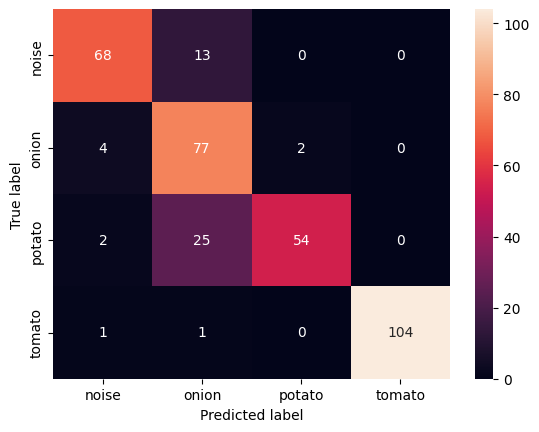

In [80]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_revamp)
conf_mat(onion_path, l2, model_revamp)
conf_mat(potato_path, l3, model_revamp)
conf_mat(tomato_path, l4, model_revamp)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels = classes, yticklabels = classes, annot = True, fmt = 'g')
ax.set(xlabel = 'Predicted label', ylabel = 'True label')
plt.show()

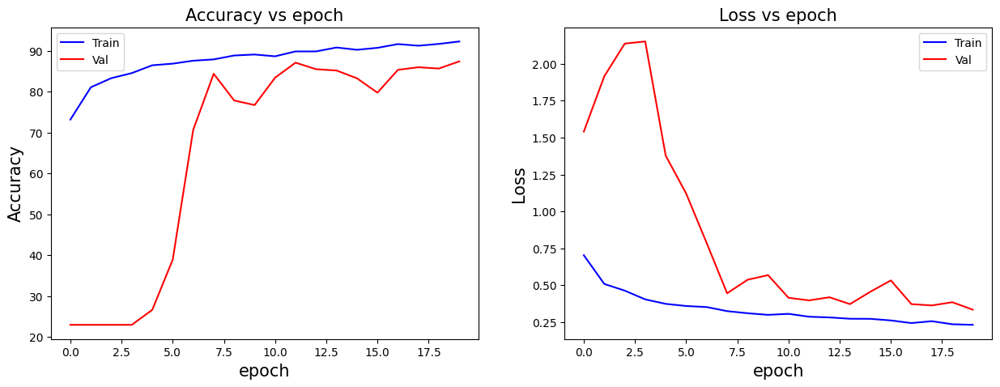

In [82]:
plot_acc_loss(history_1,n_epochs=20)

In [83]:
classwise_accuracy(noise_path, 'noise', model_revamp)
classwise_accuracy(onion_path, 'onion', model_revamp)
classwise_accuracy(potato_path, 'potato', model_revamp)
classwise_accuracy(tomato_path, 'tomato', model_revamp)

Accuracy of class noise is 83.95% consisting of 81 images
Accuracy of class onion is 92.77% consisting of 83 images
Accuracy of class potato is 66.67% consisting of 81 images
Accuracy of class tomato is 98.11% consisting of 106 images


In [84]:
base_model_1=tf.keras.applications.vgg19.VGG19(input_shape=(256,256,3),include_top=False)

In [85]:
model_1=base_model_1.output
model_1

<KerasTensor shape=(None, 8, 8, 512), dtype=float32, sparse=False, ragged=False, name=keras_tensor_81>

In [86]:
model_1=tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255,input_shape=(image_size[0],image_size[1],3)),
    base_model_1,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(4,activation='softmax')
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [87]:
model_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=tf.keras.losses.CategoricalCrossentropy(),
                metrics=['accuracy','Precision','Recall'])

In [88]:
log_dir_3='logs/VGG19'

tensorboard_cb=tf.keras.callbacks.TensorBoard(log_dir=log_dir_3,histogram_freq=1)
checkpoint_cb=tf.keras.callbacks.ModelCheckpoint('VGG19.keras',save_best_only=True)
early_stopping_cb=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

In [89]:
history_3=model_1.fit(aug_ds,validation_data=valid_ds,epochs=20,callbacks=[tensorboard_cb,checkpoint_cb,early_stopping_cb])

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 189s 2s/step - Precision: 0.6445 - Recall: 0.4011 - accuracy: 0.5475 - loss: 1.0330 - val_Precision: 0.8385 - val_Recall: 0.7783 - val_accuracy: 0.8086 - val_loss: 0.4887
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 69s 869ms/step - Precision: 0.8817 - Recall: 0.8466 - accuracy: 0.8694 - loss: 0.3410 - val_Precision: 0.8271 - val_Recall: 0.8166 - val_accuracy: 0.8262 - val_loss: 0.6268
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 71s 895ms/step - Precision: 0.9224 - Recall: 0.8923 - accuracy: 0.9047 - loss: 0.2605 - val_Precision: 0.9220 - val_Recall: 0.9043 - val_accuracy: 0.9107 - val_loss: 0.3253
Epoch 4/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 81s 884ms/step - Precision: 0.9269 - Recall: 0.9034 - accuracy: 0.9173 - loss: 0.2599 - val_Precision: 0.9413 - val_Recall: 0.9203 - val_accuracy: 0.9346 - val_loss: 0.1987
Epoch 5/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 69s 873ms/step - Precision: 0.9388 - Recall: 0.9208 - accuracy: 0.9273 - loss: 0.2057 - val_Precision: 0.9273 - val_Reca

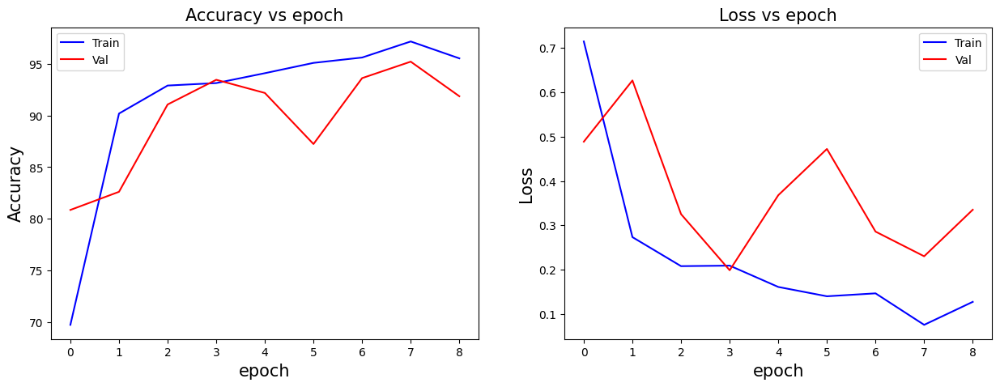

In [91]:
plot_acc_loss(history_3,n_epochs=9)

In [92]:
classwise_accuracy(noise_path, 'noise', model_1)
classwise_accuracy(onion_path, 'onion', model_1)
classwise_accuracy(potato_path, 'potato', model_1)
classwise_accuracy(tomato_path, 'tomato', model_1)

Accuracy of class noise is 96.3% consisting of 81 images
Accuracy of class onion is 89.16% consisting of 83 images
Accuracy of class potato is 88.89% consisting of 81 images
Accuracy of class tomato is 99.06% consisting of 106 images


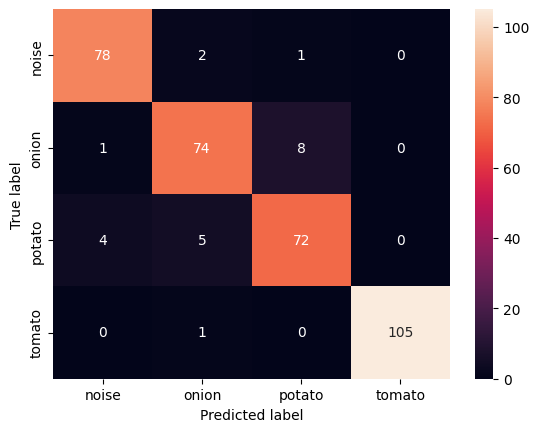

In [93]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_1)
conf_mat(onion_path, l2, model_1)
conf_mat(potato_path, l3, model_1)
conf_mat(tomato_path, l4, model_1)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=classes, yticklabels=classes, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [94]:
result = model_1.evaluate(test_ds)
dict(zip(model_1.metrics_names, result))

11/11 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - Precision: 0.9578 - Recall: 0.9254 - accuracy: 0.9337 - loss: 0.1758


{'loss': 0.18532074987888336, 'compile_metrics': 0.9316239356994629}

In [95]:
base_model_resnet=tf.keras.applications.resnet50.ResNet50(input_shape=(256,256,3),include_top=False)

In [96]:
model_resnet=base_model_resnet.output

model_resnet=tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255,input_shape=(image_size[0],image_size[1],3)),
    base_model_resnet,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(4,activation='softmax')
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [97]:
model_resnet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                     loss=tf.keras.losses.CategoricalCrossentropy(),
                     metrics=['accuracy','Precision','Recall'])

In [98]:
log_dir_resnet='logs/ResNet'

tensorboard_cb=tf.keras.callbacks.TensorBoard(log_dir=log_dir_resnet,histogram_freq=1)
checkpoint_cb=tf.keras.callbacks.ModelCheckpoint('ResNet.keras',save_best_only=True)
early_stopping_cb=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

In [99]:
history_resnet=model_resnet.fit(aug_ds,
                                validation_data=valid_ds,
                                epochs=20,
                                callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 139s 944ms/step - Precision: 0.8927 - Recall: 0.8059 - accuracy: 0.8428 - loss: 0.4134 - val_Precision: 0.2121 - val_Recall: 0.2121 - val_accuracy: 0.2121 - val_loss: 4.5252
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 37s 473ms/step - Precision: 0.9896 - Recall: 0.9888 - accuracy: 0.9892 - loss: 0.0335 - val_Precision: 0.2109 - val_Recall: 0.2105 - val_accuracy: 0.2105 - val_loss: 2.9714
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 35s 448ms/step - Precision: 0.9954 - Recall: 0.9954 - accuracy: 0.9954 - loss: 0.0149 - val_Precision: 0.2682 - val_Recall: 0.2648 - val_accuracy: 0.2679 - val_loss: 4.4173
Epoch 4/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 36s 454ms/step - Precision: 0.9970 - Recall: 0.9970 - accuracy: 0.9970 - loss: 0.0130 - val_Precision: 0.2935 - val_Recall: 0.2823 - val_accuracy: 0.2982 - val_loss: 4.6203
Epoch 5/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 38s 483ms/step - Precision: 0.9958 - Recall: 0.9958 - accuracy: 0.9958 - loss: 0.0139 - val_Precision: 0.3176 - val_R

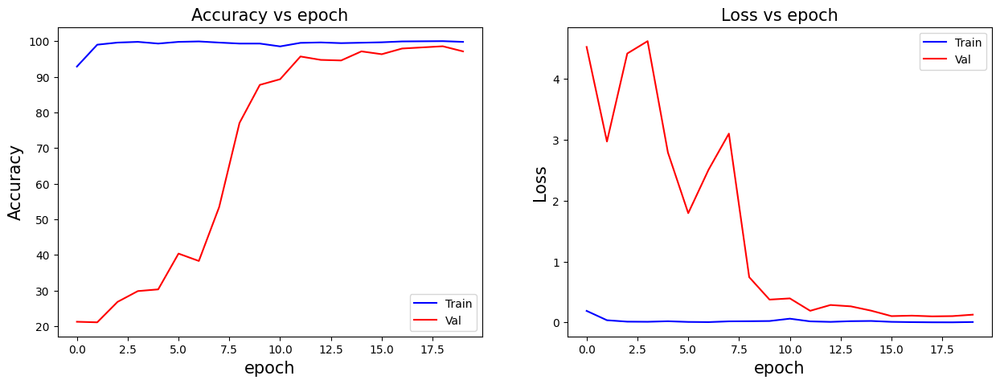

In [101]:
plot_acc_loss(history_resnet,n_epochs=20)

In [102]:
classwise_accuracy(noise_path, 'noise', model_resnet)
classwise_accuracy(onion_path, 'onion', model_resnet)
classwise_accuracy(potato_path, 'potato', model_resnet)
classwise_accuracy(tomato_path, 'tomato', model_resnet)

Accuracy of class noise is 93.83% consisting of 81 images
Accuracy of class onion is 98.8% consisting of 83 images
Accuracy of class potato is 85.19% consisting of 81 images
Accuracy of class tomato is 100.0% consisting of 106 images


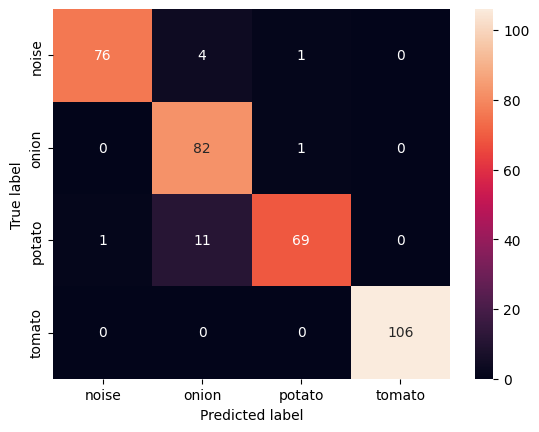

In [103]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_resnet)
conf_mat(onion_path, l2, model_resnet)
conf_mat(potato_path, l3, model_resnet)
conf_mat(tomato_path, l4, model_resnet)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=classes, yticklabels=classes, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [104]:
result = model_resnet.evaluate(test_ds)
dict(zip(model_resnet.metrics_names, result))

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 564ms/step - Precision: 0.9497 - Recall: 0.9337 - accuracy: 0.9418 - loss: 0.2198


{'loss': 0.18757696449756622, 'compile_metrics': 0.94017094373703}

In [105]:
base_model_mobilenet = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)

/tmp/ipython-input-3375231524.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model_mobilenet = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)


In [106]:
model_mobilenet = base_model_mobilenet.output

model_mobilenet= tf.keras.Sequential([
            tf.keras.layers.Rescaling(1./255,input_shape=(image_size[0], image_size[1], 3)),
            base_model_mobilenet,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [107]:
log_dir_mobilenet = "logs/MobileNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_mobilenet, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [108]:
model_mobilenet.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

In [109]:
history_mobilenet= model_mobilenet.fit(aug_ds,
                                       validation_data = valid_ds,
                                       epochs = 20,
                                       callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 96s 655ms/step - Precision: 0.8716 - Recall: 0.7776 - accuracy: 0.8261 - loss: 0.4514 - val_Precision: 0.9552 - val_Recall: 0.9522 - val_accuracy: 0.9537 - val_loss: 0.1393
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 175ms/step - Precision: 0.9901 - Recall: 0.9885 - accuracy: 0.9893 - loss: 0.0398 - val_Precision: 0.9681 - val_Recall: 0.9681 - val_accuracy: 0.9681 - val_loss: 0.0970
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - Precision: 0.9947 - Recall: 0.9941 - accuracy: 0.9941 - loss: 0.0188 - val_Precision: 0.9713 - val_Recall: 0.9713 - val_accuracy: 0.9713 - val_loss: 0.0854
Epoch 4/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - Precision: 0.9965 - Recall: 0.9959 - accuracy: 0.9965 - loss: 0.0146 - val_Precision: 0.9745 - val_Recall: 0.9745 - val_accuracy: 0.9745 - val_loss: 0.0749
Epoch 5/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - Precision: 0.9983 - Recall: 0.9983 - accuracy: 0.9983 - loss: 0.0066 - val_Precision: 0.9776 - val_Re

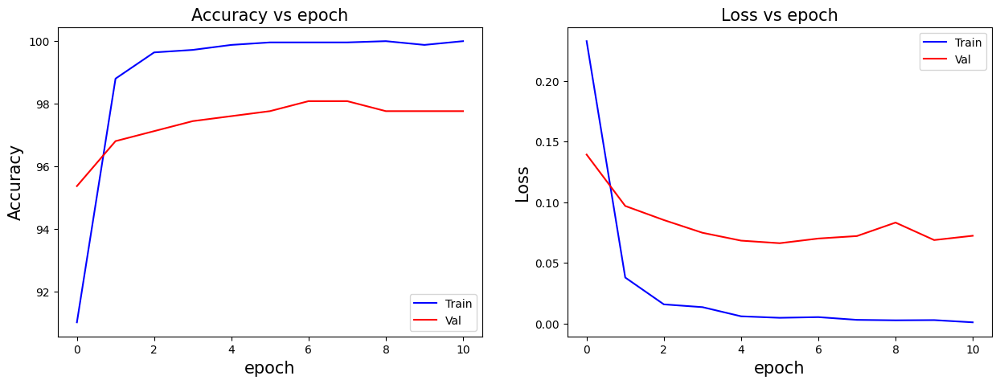

In [110]:
plot_acc_loss(history_mobilenet, n_epochs = 11)

In [111]:
classwise_accuracy(noise_path, 'noise', model_mobilenet)
classwise_accuracy(onion_path, 'onion', model_mobilenet)
classwise_accuracy(potato_path, 'potato', model_mobilenet)
classwise_accuracy(tomato_path, 'tomato', model_mobilenet)

Accuracy of class noise is 86.42% consisting of 81 images
Accuracy of class onion is 98.8% consisting of 83 images
Accuracy of class potato is 80.25% consisting of 81 images
Accuracy of class tomato is 100.0% consisting of 106 images


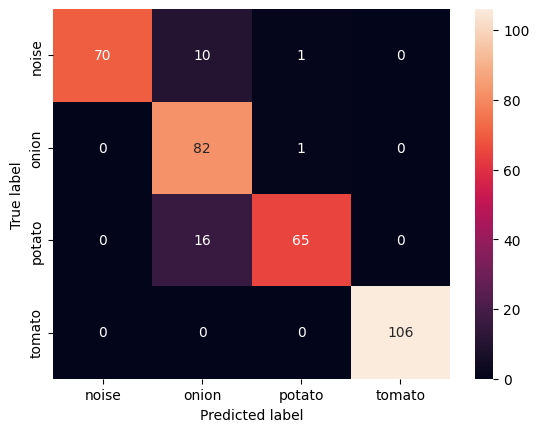

In [112]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_mobilenet)
conf_mat(onion_path, l2, model_mobilenet)
conf_mat(potato_path, l3, model_mobilenet)
conf_mat(tomato_path, l4, model_mobilenet)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=classes, yticklabels=classes, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [113]:
result = model_mobilenet.evaluate(test_ds)
dict(zip(model_mobilenet.metrics_names, result))

11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - Precision: 0.8946 - Recall: 0.8946 - accuracy: 0.8946 - loss: 0.3685


{'loss': 0.36376506090164185, 'compile_metrics': 0.9173789024353027}

In [114]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

In [115]:
model_names = ["Custom_CNN", "Custom_CNN_revamp", "VGG19", "ResNet50", "MobileNet"]
models_list=[model,model_revamp,model_1,model_resnet,model_mobilenet]


1. Custom_CNN model random sample testing: 



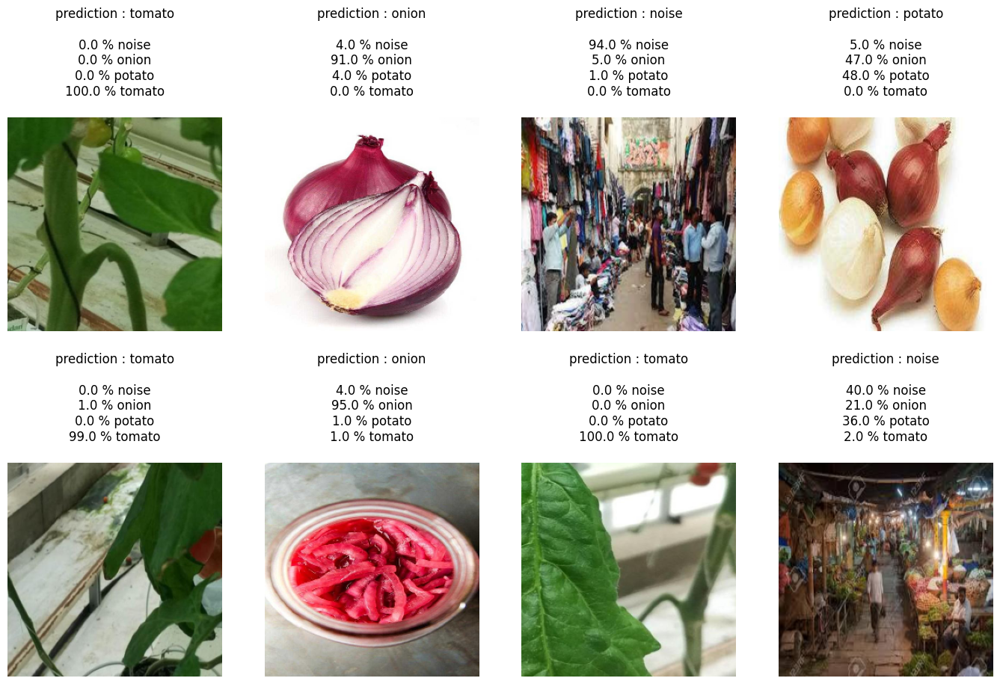


2. Custom_CNN_revamp model random sample testing: 



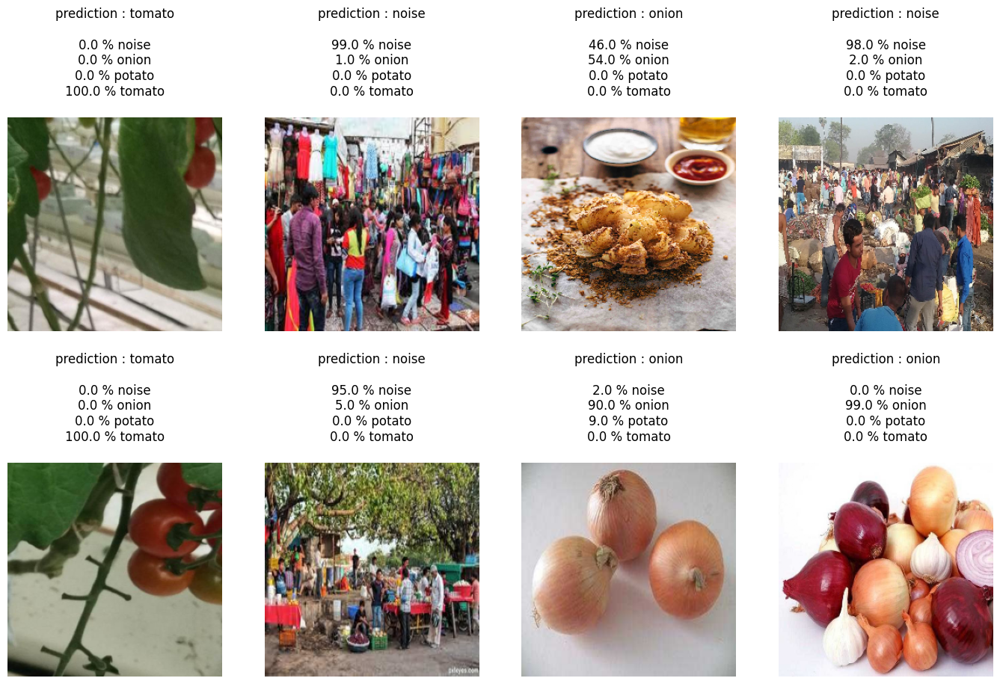


3. VGG19 model random sample testing: 



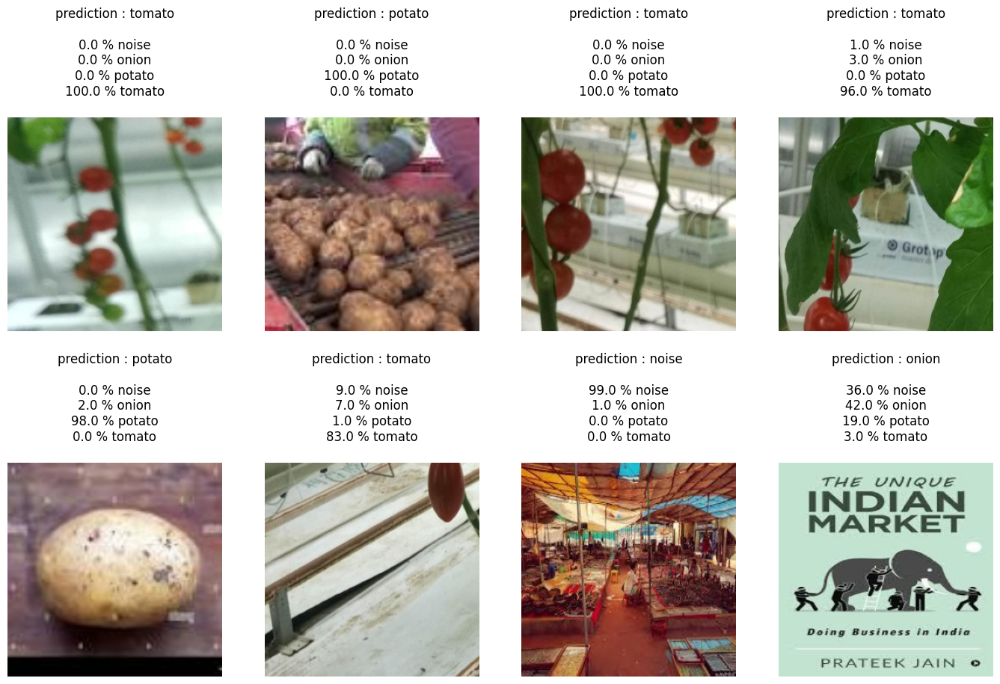


4. ResNet50 model random sample testing: 



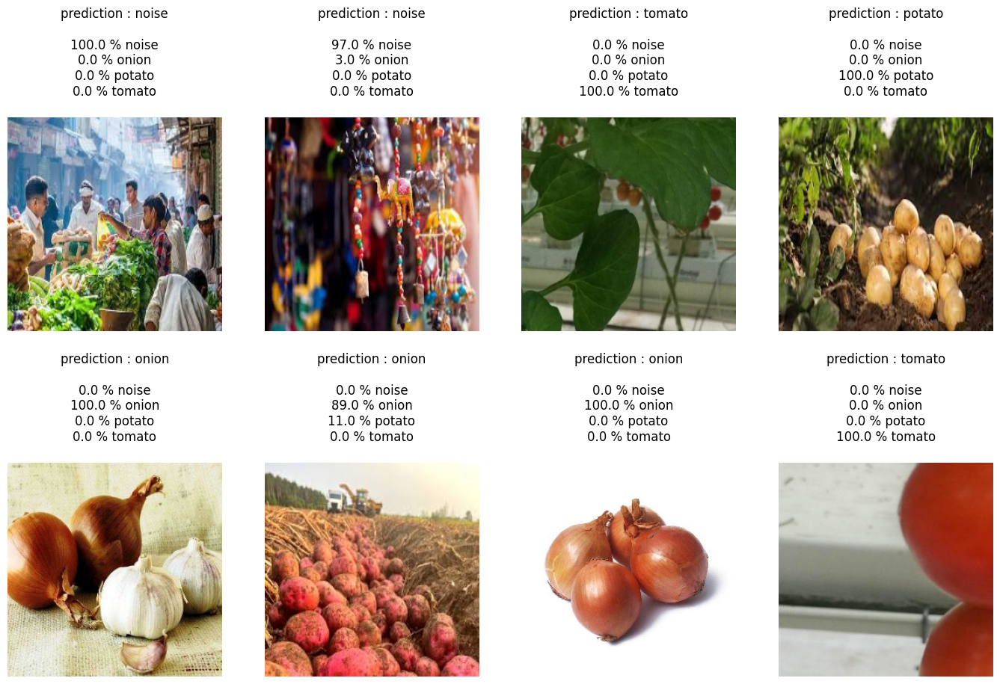


5. MobileNet model random sample testing: 



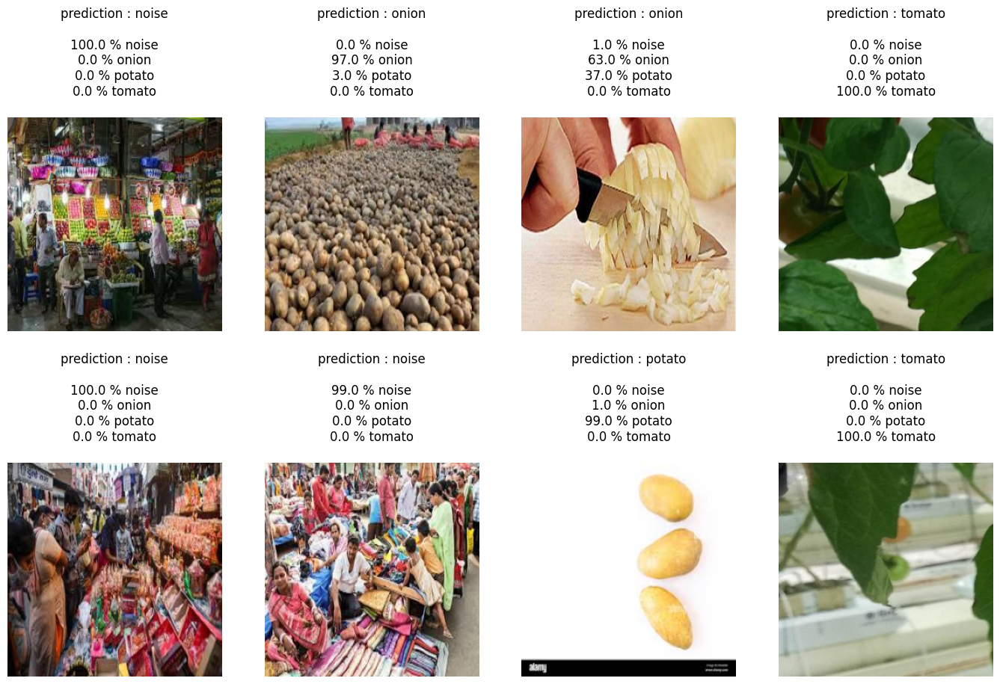

In [116]:
for i,(name,m) in enumerate(zip(model_names,models_list),start=1):
  print(f'\n{i}. {name} model random sample testing: \n')
  test_model(m)

In [117]:
for i,(name,m) in enumerate(zip(model_names,models_list),start=1):
  print(f'\n{i}. {name} model evaluation metrics: \n')
  result = m.evaluate(test_ds)
  dict(zip(m.metrics_names, result))


1. Custom_CNN model evaluation metrics: 

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - Precision: 0.8037 - Recall: 0.7275 - accuracy: 0.7685 - loss: 0.5293

2. Custom_CNN_revamp model evaluation metrics: 

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - Precision: 0.9276 - Recall: 0.8923 - accuracy: 0.9056 - loss: 0.2609

3. VGG19 model evaluation metrics: 

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - Precision: 0.9525 - Recall: 0.9265 - accuracy: 0.9342 - loss: 0.1677

4. ResNet50 model evaluation metrics: 

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - Precision: 0.9583 - Recall: 0.9533 - accuracy: 0.9554 - loss: 0.1345

5. MobileNet model evaluation metrics: 

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - Precision: 0.9396 - Recall: 0.9396 - accuracy: 0.9396 - loss: 0.2557
